
Build a model to predict which customers are at risk for late activation (the probability of not having an activation within 30 days of completing a sale) given historical data (Note that customers who do not complete an activation within 30 days of purchase may not activate at all). 


## Data

The data provided in the file ‘raw_data.csv’ is on transaction-level basis and the column titled “Sale_Date” refers to the date of sale and the column titled “Activation_Date” refers to the date of activation. The other independent variables are attributes of the customer at the time he/she completed the transaction.

The data dictionary contains the definitions of all variables.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.offline as pyo
import plotly.graph_objs as go
pyo.init_notebook_mode()

from sklearn.model_selection import train_test_split,StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.metrics import confusion_matrix, classification_report, auc, roc_curve
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.utils import resample
import xgboost as xgb

import scikitplot as skplt
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import ADASYN

from warnings import simplefilter
simplefilter(action='ignore', category=FutureWarning)
pd.set_option("display.max_columns",None)
pd.set_option("display.max_rows",None)

random_seed = 42

In [2]:
df = pd.read_csv("raw_data.csv", skipinitialspace=True, parse_dates=['Sale_Date','Activation_Date','Ship_Date'], low_memory=False)
df.head()

,Transaction_ID,Sale_Date,Ship_Date,Product_Type,Sales_Package,RMR_Rate,Transaction_Total,Sales_Rep_ID,is_ProInstall,is_eCommerce,is_Financed,Sales_Channel,Internal_Customer_ID,Customer_Type,Credit_Score,Activation_Date,Lead_Source_Campaign,State
0,344431332,2015-02-23,2016-06-07,1,NaN,19.95,332.13,9580257.0,0,No,NaN,1,51321372,Residential,NaN,NaT,1919562.0,TN
1,576148302,2015-10-23,2016-02-01,1,NaN,29.95,299.00,18866228.0,0,No,NaN,1,79892901,Residential,NaN,2016-02-03,NaN,VT
2,601610760,2015-11-15,2016-05-13,1,NaN,19.95,105.44,NaN,0,Yes,NaN,1,82832280,Residential,741-777,2016-05-20,NaN,WA
3,604083366,2015-11-17,2016-01-13,1,NaN,25.90,445.00,159049.0,0,No,NaN,1,82376823,Residential,704-741,2016-01-18,NaN,OK
4,615015234,2015-11-26,2016-01-13,1,NaN,25.90,118.95,NaN,0,Yes,NaN,1,84379179,Residential,668-704,2016-01-16,NaN,UT


In [3]:
print(df.shape)
df.dtypes

(96182, 18)


Transaction_ID                   int64
Sale_Date               datetime64[ns]
Ship_Date               datetime64[ns]
Product_Type                     int64
Sales_Package                   object
RMR_Rate                       float64
Transaction_Total              float64
Sales_Rep_ID                   float64
is_ProInstall                    int64
is_eCommerce                    object
is_Financed                     object
Sales_Channel                    int64
Internal_Customer_ID             int64
Customer_Type                   object
Credit_Score                    object
Activation_Date         datetime64[ns]
Lead_Source_Campaign           float64
State                           object
dtype: object

In [4]:
def missingValues(df):
    Missing_Values =df.isnull().sum()
    Percentage_Missing_Values = df.isna().mean().round(4) * 100
    Missing=pd.concat([Missing_Values,Percentage_Missing_Values],axis=1, keys = ['Missing_Values','Percentage_Missing_Values']).reset_index()
    return Missing.sort_values(by='Percentage_Missing_Values', ascending=False)
missingValues(df)

,index,Missing_Values,Percentage_Missing_Values
4,Sales_Package,85837,89.24
10,is_Financed,56406,58.65
14,Credit_Score,26822,27.89
16,Lead_Source_Campaign,23754,24.70
15,Activation_Date,12286,12.77
7,Sales_Rep_ID,6752,7.02
17,State,313,0.33
13,Customer_Type,0,0.00
12,Internal_Customer_ID,0,0.00
11,Sales_Channel,0,0.00


- To create the target variable we have to subtract `Sale_Date` from `Activation_Date`. But `Activation_Date` has some missing values in the Data. There can be several reasons that the Customer did not activate the Security system such as return orders, defective system, etc. So to assume anything about the `Activation_Date` and impute that variable may create bias in our model. Also, to build a robust predictive model we can ignore those 12.77% data points from our analysis.
- `Sales_Package` and `is_Financed` variables have more than 50% missing values so I will ignore those columns from analysis

### Checking Duplicate Records

The Data is on transaction-level hence we can check that do we have any duplicate records for the `Transaction_ID`.

In [5]:
duplicate = df[df.duplicated(subset=['Transaction_ID'], keep=False)]

In [6]:
print(duplicate.shape)
print("Number of unique Transaction Id: ",duplicate['Transaction_ID'].nunique())
duplicate.head(10)

(5629, 18)
Number of unique Transaction Id:  2811


,Transaction_ID,Sale_Date,Ship_Date,Product_Type,Sales_Package,RMR_Rate,Transaction_Total,Sales_Rep_ID,is_ProInstall,is_eCommerce,is_Financed,Sales_Channel,Internal_Customer_ID,Customer_Type,Credit_Score,Activation_Date,Lead_Source_Campaign,State
62,656461395,2015-12-30,2016-01-04,1,NaN,29.95,177.00,NaN,0,Yes,NaN,1,89496534,Residential,777-814,2016-01-07,NaN,NC
63,656461395,2015-12-30,2016-01-04,1,NaN,29.95,177.00,NaN,0,Yes,NaN,1,89496534,Residential,777-814,2016-01-07,NaN,NC
108,657850059,2015-12-31,2016-01-06,1,NaN,39.95,128.00,20928793.0,0,No,NaN,1,89034801,Residential,777-814,2016-01-13,1919562.0,WI
109,657850059,2015-12-31,2016-01-06,1,NaN,39.95,128.00,20928793.0,0,No,NaN,1,89034801,Residential,777-814,2016-01-13,1919562.0,WI
166,659352339,2016-01-03,2016-01-07,1,NaN,49.90,400.00,NaN,0,Yes,NaN,1,89866377,Residential,777-814,2016-01-09,NaN,HI
167,659352339,2016-01-03,2016-01-07,1,NaN,49.90,400.00,NaN,0,Yes,NaN,1,89866377,Residential,777-814,2016-01-09,NaN,HI
191,660010950,2016-01-04,2016-01-04,1,NaN,39.95,99.00,18866228.0,0,No,NaN,1,89732571,Residential,777-814,2016-01-06,11135533.0,VT
192,660010950,2016-01-04,2016-01-04,1,NaN,39.95,99.00,18866228.0,0,No,NaN,1,89732571,Residential,777-814,2016-01-06,11135533.0,VT
232,660637269,2016-01-04,2016-01-05,1,NaN,29.95,636.44,28404109.0,0,No,NaN,1,89512533,Residential,NaN,2016-01-09,1919562.0,OH
233,660637269,2016-01-04,2016-01-05,1,NaN,29.95,636.44,28404109.0,0,No,NaN,1,89512533,Residential,NaN,2016-01-09,1919562.0,OH


We have duplicate entries for `Transaction_ID` for a few `Transaction_ID`s. We will just keep one entry for these `Transaction_ID`s and delete the rest of the entries.

In [7]:
df.drop_duplicates(subset=['Transaction_ID'],keep='first',inplace=True)

In [8]:
df.shape

(93364, 18)

### Creating Target Variable

Before creating targer variable we will drop those data points where `Activation_Date` is null.

In [9]:
df.dropna(subset = ["Activation_Date"], inplace=True)

In [10]:
df['Activation_Days'] = df['Activation_Date'] - df['Sale_Date']
df['Is_Late_Activated'] = (df['Activation_Days'].dt.days > 30).astype(int)
df['Is_Late_Activated'].value_counts(normalize=True)

0    0.93772
1    0.06228
Name: Is_Late_Activated, dtype: float64

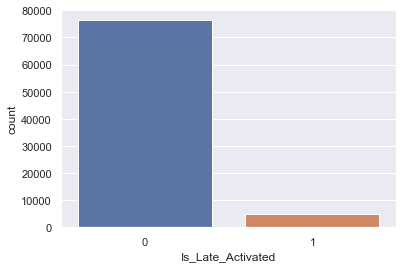

In [11]:
sns.set(style="darkgrid")
ax = sns.countplot(x="Is_Late_Activated",data=df)

We have imbalanced class distribution in our data so while building preditive model we have to leverage appropriate techniques and methods to deal with imbalance distribution of the class. I have discussed about it in detail later in the notebook.

## Feature Transformation & Engineering

Here, I am assuming that `Product_Type` and `Sales_Channel` variables are not ordinal in nature. That means we can not say that one Product_Type or Sales_channel is better than other. To represent these kind of variables, we can create dummies(indicator) for each one ctaegory in the variable. 

In [12]:
pt_dummies = pd.get_dummies(df['Product_Type'],prefix='Product_Type')
df = pd.concat([df, pt_dummies], axis=1)

In [13]:
sc_dummies = pd.get_dummies(df['Sales_Channel'],prefix='Sales_Channel')
df = pd.concat([df, sc_dummies], axis=1)

In [14]:
df['is_eCommerce_IND'] = df['is_eCommerce'].map({'No':0,'Yes':1})
df['Customer_Type_IND'] = df['Customer_Type'].map({'Residential':0,'Commercial':1})

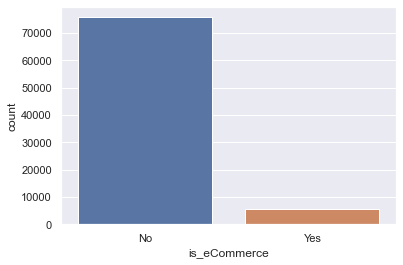

In [15]:
sns.set(style="darkgrid")
ax = sns.countplot(x="is_eCommerce",data=df)

In [16]:
df['Product_Type'].value_counts()

1    78166
2     3273
Name: Product_Type, dtype: int64

`Ship_Date` is a mid-event which happens between `Sale_Date` and `Activation_Date` so lets create two variables. first, subtracting Sale_Date from Ship_Date and second, subtracting Ship_Date from Activation_Date.

In [17]:
df['Order_Lead_Time'] = (df['Ship_Date'] - df['Sale_Date']).dt.days
df['Days_Difference'] = (df['Activation_Date'] - df['Ship_Date']).dt.days

In [18]:
df.head()

,Transaction_ID,Sale_Date,Ship_Date,Product_Type,Sales_Package,RMR_Rate,Transaction_Total,Sales_Rep_ID,is_ProInstall,is_eCommerce,is_Financed,Sales_Channel,Internal_Customer_ID,Customer_Type,Credit_Score,Activation_Date,Lead_Source_Campaign,State,Activation_Days,Is_Late_Activated,Product_Type_1,Product_Type_2,Sales_Channel_1,Sales_Channel_2,Sales_Channel_3,is_eCommerce_IND,Customer_Type_IND,Order_Lead_Time,Days_Difference
1,576148302,2015-10-23,2016-02-01,1,NaN,29.95,299.00,18866228.0,0,No,NaN,1,79892901,Residential,NaN,2016-02-03,NaN,VT,103 days,1,1,0,1,0,0,0,0,101,2
2,601610760,2015-11-15,2016-05-13,1,NaN,19.95,105.44,NaN,0,Yes,NaN,1,82832280,Residential,741-777,2016-05-20,NaN,WA,187 days,1,1,0,1,0,0,1,0,180,7
3,604083366,2015-11-17,2016-01-13,1,NaN,25.90,445.00,159049.0,0,No,NaN,1,82376823,Residential,704-741,2016-01-18,NaN,OK,62 days,1,1,0,1,0,0,0,0,57,5
4,615015234,2015-11-26,2016-01-13,1,NaN,25.90,118.95,NaN,0,Yes,NaN,1,84379179,Residential,668-704,2016-01-16,NaN,UT,51 days,1,1,0,1,0,0,1,0,48,3
5,635226759,2015-12-12,2016-01-04,1,NaN,19.95,186.00,NaN,0,Yes,NaN,1,86806227,Residential,777-814,2016-01-25,NaN,MI,44 days,1,1,0,1,0,0,1,0,23,21


In [19]:
data = [go.Histogram(
    x=df['Days_Difference'],xbins=dict(start=min(df['Days_Difference']),end=max(df['Days_Difference']),size=20))]
layout = go.Layout(
    title="Days Difference between Activation Date and<br>\
    Ship Date")
fig = go.Figure(data=data, layout=layout)
pyo.iplot(fig)

So Based on the Distribution of the `Days_Difference` (Difference between Activation_Date and Ship_Date) variable we can say that there are instances where clients have activated their account even before their security system order shipped. 

This is a unique type of sale called a ‘Take-over’   - in these cases, customers already have a Security system in their Home so the order BHS ships is generally an add-on thing that the customer does not require for the activation.  

Based on this, we can create one variable indicating whether Transaction was a 'Take-over' or not.

In [20]:
df['Sale_Type'] = (df['Activation_Date'] < df['Ship_Date']).astype(int)

Lets loot at the distribution of the `Order_Lead_Time` as well.

In [65]:
data = [go.Histogram(
    x=df['Order_Lead_Time'],xbins=dict(start=min(df['Order_Lead_Time']),end=max(df['Order_Lead_Time']),size=20))]
layout = go.Layout(
    title="Days Difference between Ship Date and<br>\
    Sale Date")
fig = go.Figure(data=data, layout=layout)
pyo.iplot(fig)

In [22]:
(df['Order_Lead_Time'] >= 20).sum()

343

we have 343 instances when Order shipped 20 or more days after the Sale Date. May be customers will never get a chance enough time to activate the system. Also, for orders which shipped within 20 days we dont know when it gets delivered to the customer. I wish we would have deliver Date in the data that have provided more predictive ability in our model.

In [23]:
# test = df.copy()
# data = [go.Scatter(
#     x = test['Days_Difference'],
#     y = test['Order_Lead_Time'],
#     mode = 'markers',
# )]
# layout = go.Layout(
#     title = 'Random Data Scatterplot', # Graph title
#     xaxis = dict(title = 'Days Difference between Account activation Date and Order Shipped Date'), # x-axis label
#     yaxis = dict(title = 'Days Difference between Order Shipped Date and Order Sale Date'), # y-axis label
#     hovermode ='closest' # handles multiple points landing on the same vertical
# )
# fig = go.Figure(data=data, layout = layout)
# pyo.iplot(fig)

In [24]:
# bad_data = df[df['Days_Difference'] < 0]
# bad_data.to_csv("bad_data.csv")

In [25]:
(df['Order_Lead_Time'] == 0).sum() 

29429

In [64]:
data = [go.Scatter(
    x = df['RMR_Rate'],
    y = df['Transaction_Total'],
    mode = 'markers'
)]

layout = go.Layout(title='Transaction Total vs RMR_Rate',hovermode ='closest')
fig = go.Figure(data=data, layout=layout)
pyo.iplot(fig)

So we have quite a few transactions where `Transaction_Total` is zero. Interesting!!

In [67]:
data = [go.Histogram(
    x=df[df['Is_Late_Activated']==0]['Transaction_Total'],
    opacity=0.75,
    name='Activated'
),
go.Histogram(
    x=df[df['Is_Late_Activated']==1]['Transaction_Total'],
    opacity=0.75,
    name='Late/Non Activated'
)]

layout = go.Layout(
    barmode='overlay',
    title="Transaction Total Comparision for Activated/Late-Non Activated customers"
)
fig = go.Figure(data=data, layout=layout)
pyo.iplot(fig)

Customers who are Late/Non Activated have lower Transaction_Total comapred to Activated transactions.

If system activation is a little time-consuming activity, then, in general, we, humans, like to do such tasks over the weekend. If We ship order in such a way that, we can deliver the security system over the weekend then it may increase the probability of the system activation within 30 days. By considering this thing in a mind Lets create a few date variables from the Ship Date.

In [26]:
df['Ship_Date_Year'] = df['Ship_Date'].dt.year
df['Ship_Date_Month'] = df['Ship_Date'].dt.month
df['Ship_Date_Week'] = df['Ship_Date'].dt.week
df['Ship_Date_Day'] = df['Ship_Date'].dt.day
df['Ship_Date_Quarter'] = df['Ship_Date'].dt.quarter
df['Ship_Date_Weekday'] = df['Ship_Date'].dt.weekday
df['Ship_Date_Weekofyear'] = df['Ship_Date'].dt.weekofyear
df['Ship_Date_Dayofyear'] = df['Ship_Date'].dt.dayofyear
df['Ship_Date_Isweekend'] = np.where(df['Ship_Date_Weekday'].isin([5,6]),1,0)

In [27]:
df['Sale_Date_Year'] = df['Sale_Date'].dt.year
df['Sale_Date_Month'] = df['Sale_Date'].dt.month
df['Sale_Date_Week'] = df['Sale_Date'].dt.week
df['Sale_Date_Day'] = df['Sale_Date'].dt.day
df['Sale_Date_Quarter'] = df['Sale_Date'].dt.quarter
df['Sale_Date_Weekday'] = df['Sale_Date'].dt.weekday
df['Sale_Date_Weekofyear'] = df['Sale_Date'].dt.weekofyear
df['Sale_Date_Dayofyear'] = df['Sale_Date'].dt.dayofyear
df['Sale_Date_Isweekend'] = np.where(df['Sale_Date_Weekday'].isin([5,6]),1,0)

In [28]:
df['RMR_Amount'] = (df['RMR_Rate']*df['Transaction_Total'])/100

In [29]:
df['Credit_Score'].value_counts(dropna=False)

NaN        19514
777-814    13882
741-777    11294
704-741     8510
668-704     7383
632-668     5710
595-632     3554
814-850     3206
559-595     2923
522-559     2592
486-522     1833
450-486      809
413-450      206
377-413       19
340-377        2
303-340        2
Name: Credit_Score, dtype: int64

In [30]:
df['Credit_Score_Category'] = df['Credit_Score'].map({ '814-850':'Excellent',
                        '777-814':'Very Good','741-777':'Very Good',
                        '704-741':'Good','668-704':'Good',
                        '632-668':'Fair','595-632':'Fair','559-595':'Fair',
                        '522-559':'Poor','486-522':'Poor','450-486':'Poor','413-450':'Poor','377-413':'Poor','303-340':'Poor','340-377':'Poor'
                      })
df['Credit_Score_Category'].value_counts(dropna=False)

Very Good    25176
NaN          19514
Good         15893
Fair         12187
Poor          5463
Excellent     3206
Name: Credit_Score_Category, dtype: int64

When one newly purchases the Credit Card and does not have enough history then one will not have a FICO score. But once enough credit history is reported he can have any score between 300-850. So here I will be imputing FICO-Score randomly in proportion to available categories.

In [31]:
credit_score_null = df[df['Credit_Score_Category'].isnull()].index
a = df.Credit_Score_Category.value_counts()/df.Credit_Score_Category.value_counts().sum()
for j in credit_score_null:
    df.loc[j,'Credit_Score_Category']=np.random.choice([i for i in a.index], p=[v for v in a])

In [32]:
df['Credit_Score_Category'].value_counts(dropna=False)

Very Good    33249
Good         20839
Fair         15975
Poor          7179
Excellent     4197
Name: Credit_Score_Category, dtype: int64

In [33]:
df['Credit_Score_Category_IND'] = df['Credit_Score_Category'].map({'Poor':0,'Fair':1,'Good':2,'Very Good':3,'Excellent':4})

In [34]:
df['Lead_Source_Campaign'] = df['Lead_Source_Campaign'].fillna(0)
df['Lead_Source_Campaign_IND'] = (df['Lead_Source_Campaign'] > 0).astype(int)

In [35]:
state_null = df[df['State'].isnull()].index
a = df.State.value_counts()/df.State.value_counts().sum()
for j in state_null:
    df.loc[j,'State']=np.random.choice([i for i in a.index], p=[v for v in a])

In [36]:
state_means = df.groupby('State').Is_Late_Activated.mean()

In [37]:
df['State_Imputed'] = df['State'].map(state_means)

## Quantitative Model

In [38]:
train_col_list = ['is_ProInstall','Product_Type_1','Product_Type_2','is_eCommerce_IND',
                  #'Sales_Channel_1','Sales_Channel_2','Sales_Channel_3',
                  'Customer_Type_IND','RMR_Amount','Transaction_Total',
                  'Credit_Score_Category_IND', 'Order_Lead_Time',
                  'Ship_Date_Year','Ship_Date_Month','Ship_Date_Day','Ship_Date_Week','Ship_Date_Dayofyear','Ship_Date_Quarter','Ship_Date_Weekday','Ship_Date_Weekofyear','Ship_Date_Isweekend',
                  'Sale_Date_Year','Sale_Date_Month','Sale_Date_Day','Sale_Date_Week','Sale_Date_Dayofyear','Sale_Date_Quarter','Sale_Date_Weekday','Sale_Date_Weekofyear','Sale_Date_Isweekend',
                  'Lead_Source_Campaign_IND','Sale_Type']

In [39]:
y = df['Is_Late_Activated']
X = df[train_col_list]

In [40]:
print(X.shape, y.shape)

(81439, 29) (81439,)


In [41]:
y.value_counts()

0    76367
1     5072
Name: Is_Late_Activated, dtype: int64

In [42]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y, stratify=y, random_state = random_seed,test_size=0.25)

In [44]:
y_train.value_counts(normalize=True)

0    0.93772
1    0.06228
Name: Is_Late_Activated, dtype: float64

In [45]:
y_test.value_counts(normalize=True)

0    0.937721
1    0.062279
Name: Is_Late_Activated, dtype: float64

This is a supervised learning problem where we have to classify whether the client will have an activated system within 30 days of the sale date(0) or not(1). We can use different classification algorithms to predict that. Before I go into the modeling I will talk about the class imbalance and how to deal with that.

**Imbalance Class Distribution**:

Our dataset has the Imbalanced class distribution where it has ~94% and 6% distribution of target class (94% majority class and 6% Minority class(important class)).In our case it is more importane to predict the `Is_Late_Activated`, activation_status of the Security system. By Default, machine learning models try to increase overall accuracy and our naive model (null model) will always give high accuracy in this kind of imbalanced class distribution. 

There are several disadvantages when building a model with imbalanced data:
- Bias: The classification output is biased as the classifiers are more sensitive to detecting the majority class and less sensitive to the minority class.
- Optimization Metrics: Normal optimization metrics, such as accuracy, may not be indicative of true performance, especially when there is increased risk associated with false-negative or false-positive predictions.
- Difficulty Getting More Data: Datasets are often imbalanced because of real world factors, as with the credit card example mentioned above. Namely, the minority class is simply a rare event, which makes finding data that would hopefully balance the class distribution of the dataset very difficult.


There are different techniques and methods i.e. Random Under-Sampling, Random Over Sampling, SMOTE to deal with these type of datasets. Among all available techniques, The method I tried is called SMOTE. 

SMOTE synthesises new minority instances between existing (real) minority instances. SMOTE proceeds by joining the points of the minority class with line segments and then places artificial points on these lines.

**The steps I took to prevent overfitting**:

Cross-Validation on Oversampled Data(using SMOTE): Lets think for a moment about how the Cross-validation on Oversampled data happens. We split the data first into training and test, followed by oversampling the minority class in the training data using SMOTE, then passing that balanced dataset through cross-validation. During cross-validation, the already oversampled training data was further divided into train and validation sets. This causes two problems:

1) Synthetic observations could end up in both the training and validation sets during the same iteration. A sophisticated model architecture like Random Forest will be able to recognize these feature values are from the same distribution and predict accurately on validation, thereby inflating recall scores.

2) The model training and application process are not representative of the testing environment. In each iteration of cross-validation, the model is both trained and applied on balanced datasets, while in reality it will be trained on a balanced dataset and applied on an imbalanced dataset.

The ideal way to deal with this problem would be to perform oversampling of the training set in each cross-validation iteration, not before beginning the process. This prevents the data leakage from the validation set to the training set during cross-validation, and reflects how the model trained on a balanced training set would perform when applied to an imbalanced, unseen test set.

### Random Forest

In [46]:
def metrics(true, preds):
    """
    Function to calculate evaluation metrics 
    parameters: true values, predictions
    prints accuracy, recall, precision and f1 scores
    """
    accuracy = accuracy_score(true, preds)
    recall = recall_score(true, preds)
    precision = precision_score(true, preds)
    f1score = f1_score(true, preds)
    print ('accuracy: {}, recall: {}, precision: {}, f1-score: {}'.format(accuracy, recall, precision, f1score))

In [47]:
kf = StratifiedKFold(n_splits=5, random_state=random_seed)
cross_val_f1_score_lst = []
cross_val_accuracy_lst = []
cross_val_recall_lst = []
cross_val_precision_lst = []

for train_index_ls, validation_index_ls in kf.split(X_train, y_train):
    # keeping validation set apart and oversampling in each iteration using smote 
    train, validation = X_train.iloc[train_index_ls], X_train.iloc[validation_index_ls]
    target_train, target_val = y_train.iloc[train_index_ls], y_train.iloc[validation_index_ls]
    sm = SMOTE(random_state=random_seed)
    X_train_res, y_train_res = sm.fit_sample(train, target_train)
    print (X_train_res.shape, y_train_res.shape)
    
    # training the model on oversampled 4 folds of training set
    rf = RandomForestClassifier(n_estimators=10, random_state=random_seed)
    rf.fit(X_train_res, y_train_res)
    # testing on 1 fold of validation set
    validation_preds = rf.predict(validation)
    cross_val_recall_lst.append(recall_score(target_val, validation_preds))
    cross_val_accuracy_lst.append(accuracy_score(target_val, validation_preds))
    cross_val_precision_lst.append(precision_score(target_val, validation_preds))
    cross_val_f1_score_lst.append(f1_score(target_val, validation_preds))
print ('Cross validated accuracy: {}'.format(np.mean(cross_val_accuracy_lst)))
print ('Cross validated recall score: {}'.format(np.mean(cross_val_recall_lst)))
print ('Cross validated precision score: {}'.format(np.mean(cross_val_precision_lst)))
print ('Cross validated f1_score: {}'.format(np.mean(cross_val_f1_score_lst)))

(91640, 29) (91640,)
(91640, 29) (91640,)
(91640, 29) (91640,)
(91640, 29) (91640,)
(91640, 29) (91640,)
Cross validated accuracy: 0.8761112902668062
Cross validated recall score: 0.12697385711321668
Cross validated precision score: 0.1021863219882008
Cross validated f1_score: 0.11319759515856136


In [48]:
r_s_1, p_s_1 = np.mean(cross_val_recall_lst), np.mean(cross_val_precision_lst)
a_s_1, f_s_1 = np.mean(cross_val_accuracy_lst), np.mean(cross_val_f1_score_lst)
metrics_df_right = pd.DataFrame(list(zip([r_s_1], [p_s_1], [f_s_1], [a_s_1])), columns=['Recall', 'Precision', 'F1-score', 'Accuracy'])
metrics_df_right

,Recall,Precision,F1-score,Accuracy
0,0.126974,0.102186,0.113198,0.876111


In [72]:
pred_xtrain_rf = rf.predict(X_train)
metrics(y_train,pred_xtrain_rf)

accuracy: 0.960821231519835, recall: 0.7434279705573081, precision: 0.6661955241460542, f1-score: 0.7026959870791403


In [73]:
pred_xtest_rf = rf.predict(X_test)
metrics(y_test,pred_xtest_rf)

accuracy: 0.8780451866404715, recall: 0.15220820189274448, precision: 0.12054965646470955, f1-score: 0.13454165214360403


We can see that doing over-sampling in each cross-validation greatly helps us to reduce the over-fitting of the model. Although my model is not good cross-validated metrics are very close to the actual distribution of the data. we have underfitting of the data.

### Logistic Regression

In [53]:
kf = StratifiedKFold(n_splits=5, random_state=random_seed)
cross_val_f1_score_lst = []
cross_val_accuracy_lst = []
cross_val_recall_lst = []
cross_val_precision_lst = []

for train_index_ls, validation_index_ls in kf.split(X_train, y_train):
    # keeping validation set apart and oversampling in each iteration using smote
    
    train, validation = X_train.iloc[train_index_ls], X_train.iloc[validation_index_ls]
    target_train, target_val = y_train.iloc[train_index_ls], y_train.iloc[validation_index_ls]
    
    std_scale = StandardScaler()
    train = std_scale.fit_transform(train)
    validation = std_scale.fit_transform(validation)
    
    sm = SMOTE(random_state=random_seed)
    X_train_res, y_train_res = sm.fit_sample(train, target_train)
    print (X_train_res.shape, y_train_res.shape)
    
    # training the model on oversampled 4 folds of training set
    lr = LogisticRegression(max_iter = 10000,random_state=random_seed)
    lr.fit(X_train_res, y_train_res)
    # testing on 1 fold of validation set
    validation_preds = lr.predict(validation)
    cross_val_recall_lst.append(recall_score(target_val, validation_preds))
    cross_val_accuracy_lst.append(accuracy_score(target_val, validation_preds))
    cross_val_precision_lst.append(precision_score(target_val, validation_preds))
    cross_val_f1_score_lst.append(f1_score(target_val, validation_preds))
print ('Cross validated accuracy: {}'.format(np.mean(cross_val_accuracy_lst)))
print ('Cross validated recall score: {}'.format(np.mean(cross_val_recall_lst)))
print ('Cross validated precision score: {}'.format(np.mean(cross_val_precision_lst)))
print ('Cross validated f1_score: {}'.format(np.mean(cross_val_f1_score_lst)))

(91640, 29) (91640,)
(91640, 29) (91640,)
(91640, 29) (91640,)
(91640, 29) (91640,)
(91640, 29) (91640,)
Cross validated accuracy: 0.7345568885454103
Cross validated recall score: 0.4455940936440971
Cross validated precision score: 0.1072184002857713
Cross validated f1_score: 0.1728231619261563


In [54]:
r_s_1, p_s_1 = np.mean(cross_val_recall_lst), np.mean(cross_val_precision_lst)
a_s_1, f_s_1 = np.mean(cross_val_accuracy_lst), np.mean(cross_val_f1_score_lst)
metrics_df_right = pd.DataFrame(list(zip([r_s_1], [p_s_1], [f_s_1], [a_s_1])), columns=['Recall', 'Precision', 'F1-score', 'Accuracy'])
metrics_df_right

,Recall,Precision,F1-score,Accuracy
0,0.445594,0.107218,0.172823,0.734557


### Support Vector Machine

In [55]:
kf = StratifiedKFold(n_splits=5, random_state=random_seed)
cross_val_f1_score_lst = []
cross_val_accuracy_lst = []
cross_val_recall_lst = []
cross_val_precision_lst = []

for train_index_ls, validation_index_ls in kf.split(X_train, y_train):
    # keeping validation set apart and oversampling in each iteration using smote
    
    train, validation = X_train.iloc[train_index_ls], X_train.iloc[validation_index_ls]
    target_train, target_val = y_train.iloc[train_index_ls], y_train.iloc[validation_index_ls]
    
    std_scale = StandardScaler()
    train = std_scale.fit_transform(train)
    validation = std_scale.fit_transform(validation)
    
    sm = SMOTE(random_state=random_seed)
    X_train_res, y_train_res = sm.fit_sample(train, target_train)
    print (X_train_res.shape, y_train_res.shape)
    
    # training the model on oversampled 4 folds of training set
    linear_svc = LinearSVC(C=0.1, max_iter=10000, random_state=random_seed)
    linear_svc.fit(X_train_res, y_train_res)
    # testing on 1 fold of validation set
    validation_preds = linear_svc.predict(validation)
    cross_val_recall_lst.append(recall_score(target_val, validation_preds))
    cross_val_accuracy_lst.append(accuracy_score(target_val, validation_preds))
    cross_val_precision_lst.append(precision_score(target_val, validation_preds))
    cross_val_f1_score_lst.append(f1_score(target_val, validation_preds))
print ('Cross validated accuracy: {}'.format(np.mean(cross_val_accuracy_lst)))
print ('Cross validated recall score: {}'.format(np.mean(cross_val_recall_lst)))
print ('Cross validated precision score: {}'.format(np.mean(cross_val_precision_lst)))
print ('Cross validated f1_score: {}'.format(np.mean(cross_val_f1_score_lst)))

(91640, 29) (91640,)
(91640, 29) (91640,)


c:\users\jainik patel\appdata\local\programs\python\python36\lib\site-packages\sklearn\svm\_base.py:977: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



(91640, 29) (91640,)


c:\users\jainik patel\appdata\local\programs\python\python36\lib\site-packages\sklearn\svm\_base.py:977: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



(91640, 29) (91640,)


c:\users\jainik patel\appdata\local\programs\python\python36\lib\site-packages\sklearn\svm\_base.py:977: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



(91640, 29) (91640,)
Cross validated accuracy: 0.7432669876457628
Cross validated recall score: 0.4371806487308943
Cross validated precision score: 0.10938360436364511
Cross validated f1_score: 0.17496548264741374


c:\users\jainik patel\appdata\local\programs\python\python36\lib\site-packages\sklearn\svm\_base.py:977: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



In [56]:
r_s_1, p_s_1 = np.mean(cross_val_recall_lst), np.mean(cross_val_precision_lst)
a_s_1, f_s_1 = np.mean(cross_val_accuracy_lst), np.mean(cross_val_f1_score_lst)
metrics_df_right = pd.DataFrame(list(zip([r_s_1], [p_s_1], [f_s_1], [a_s_1])), columns=['Recall', 'Precision', 'F1-score', 'Accuracy'])
metrics_df_right

,Recall,Precision,F1-score,Accuracy
0,0.437181,0.109384,0.174965,0.743267


### Evaluation Metric

**Accuracy = Correct Predictions / Total Predictions**

Although widely used, classification accuracy is almost universally inappropriate for imbalanced classification. The reason is, a high accuracy (or low error) is achievable by a no skill model that only predicts the majority class.

For imbalanced classification problems, the majority class is typically referred to as the negative outcome (e.g. such as “no change” or “negative test result“), and the minority class is typically referred to as the positive outcome (e.g. “change” or “positive test result“).

- Majority Class: Negative outcome, class 0.
- Minority Class: Positive outcome, class 1.

Most threshold metrics can be best understood by the terms used in a confusion matrix for a binary (two-class) classification problem. The confusion matrix provides more insight into not only the performance of a predictive model but also which classes are being predicted correctly, which incorrectly, and what type of errors are being made.

### Precision-Recall Metrics

Precision summarizes the fraction of examples assigned the positive class that belong to the positive class.

**Precision = TruePositive / (TruePositive + FalsePositive)**

Recall summarizes how well the positive class was predicted and is the same calculation as sensitivity.

**Recall = TruePositive / (TruePositive + FalseNegative)**

Precision and recall can be combined into a single score that seeks to balance both concerns, called the F-score or the F-measure.

**F-Measure = (2 * Precision * Recall) / (Precision + Recall)**

The F-Measure is a popular metric for imbalanced classification. I would be evaluating my trainging model based on F-1 score.

The Fbeta-measure measure is an abstraction of the F-measure where the balance of precision and recall in the calculation of the harmonic mean is controlled by a coefficient called beta.




## Results Analysis

Although, Logistic regression and SVM has more F-1 score compared to Random Forest, Random forest has pretty balanced Precision and Recall. Because in our case, we would like minimize the False-Positive as well as False-Negative. We will not like to make errors in such cases also where customer has already activated system but because of our wrong model we are sending them notifications to activate the system. So, i will choose Random Forest as my final to predict on the test dataset.

In [70]:
predicted_probabilities = rf.predict_proba(X_test)

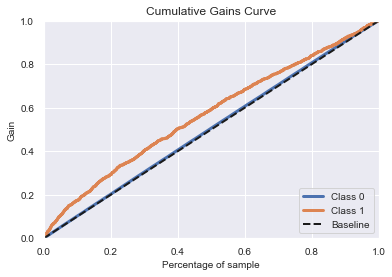

In [71]:
skplt.metrics.plot_cumulative_gain(y_test, predicted_probabilities)

The Cumulative gains curve is an evaluation curve that assesses the performance of the model and comapres the results with the random pick. It shows the percentage of targets reached when considering a certain percentage of the population with the highest probability to be target according to the model. Gain at a given bin level is the ratio of cumulative number of targets (events) up to that bin to the total number of targets (events) in the entire data set.

**Interpretation:** Based on this gain chart we can say that, We can target the 20% of the observations , the model will ensure that ~30% of the Late Activaters are in this group, while the random pick would provide only the 20% of the traget.

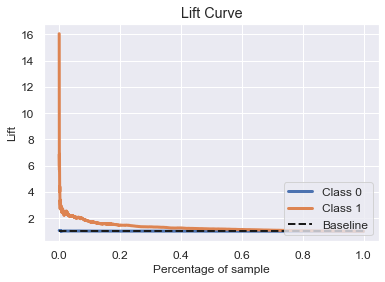

In [59]:
skplt.metrics.plot_lift_curve(y_test, predicted_probabilities)

The lift is a measure of the performance of a targeting model at predicting or classifying cases as having an enhanced response (for the population as a whole), measured against a random choice targeting model. Indeed, it is derived from the gain chart. So, the lift curve indicates how many times more than average targets are included in this group. Lift is calculated as the ratio of Cumulative Gains from classification and random models.

**Interpretation**: Consider the lift at 20%; we can notice that the top 20% of observations contain 30% of targets. If the average incidence of targets is 20%, so the lift is 1.5. Thus, the model allows addressing 1.5 times more targets for this group, compared with addressing without the model, that is randomly.

### Gains Table

In [60]:
def gains_table(actual_label,pred_proba,bins):
    y_actual = actual_label
    y_prob = pred_proba
    y_pred = rf.predict(X_test)

    cols = ['ACTUAL','PROB_POSITIVE','PREDICTED']
    data = [y_actual,y_prob,y_pred]
    
    result = pd.DataFrame(dict(zip(cols,data)))
    #result = pd.DataFrame(data,columns=cols)
    result = result.sort_values(by=['PROB_POSITIVE'],ascending=False)
    #print(result.head())
    index = int(result.shape[0]/bins)
    
    gain_table = pd.DataFrame(columns=['Bin','NumberOfCases','NumberOfResponses','Score'])
    
    for i in range(bins):
        if i==(bins-1):
            test = result[i*index:]
            NumberOfCases = int(len(test))
            NumberOfResponses = sum(test['PREDICTED'])
            score = np.mean(test['PROB_POSITIVE'])
            gain_table = gain_table.append({'Bin':i+1,'NumberOfCases':NumberOfCases,'NumberOfResponses':NumberOfResponses,'Score':score},ignore_index=True)
        else:
            test = result[i*index:(i+1)*index]
            NumberOfCases = int(len(test))
            NumberOfResponses = sum(test['PREDICTED'])
            score = np.mean(test['PROB_POSITIVE'])
            gain_table = gain_table.append({'Bin':i+1,'NumberOfCases':NumberOfCases,'NumberOfResponses':NumberOfResponses,'Score':score},ignore_index=True)
    gain_table['CumulativeResponses'] = np.cumsum(gain_table['NumberOfResponses'])
    gain_table['% of events'] = gain_table['NumberOfResponses']/np.sum(gain_table['NumberOfResponses'])*100
    gain_table['Gain']= np.cumsum(gain_table['% of events'])
    gain_table['Lift'] = gain_table['Gain']/(gain_table['Bin']*(100/bins))
    return gain_table

In [61]:
pred_proba = rf.predict_proba(X_test)[:,1]

In [62]:
gains_table(y_test,pred_proba,10)

,Bin,NumberOfCases,NumberOfResponses,Score,CumulativeResponses,% of events,Gain,Lift
0,1.0,2036.0,1601.0,0.666812,1601.0,100.0,100.0,10.000000
1,2.0,2036.0,0.0,0.385793,1601.0,0.0,100.0,5.000000
2,3.0,2036.0,0.0,0.251234,1601.0,0.0,100.0,3.333333
3,4.0,2036.0,0.0,0.173729,1601.0,0.0,100.0,2.500000
4,5.0,2036.0,0.0,0.100000,1601.0,0.0,100.0,2.000000
5,6.0,2036.0,0.0,0.081780,1601.0,0.0,100.0,1.666667
6,7.0,2036.0,0.0,0.000000,1601.0,0.0,100.0,1.428571
7,8.0,2036.0,0.0,0.000000,1601.0,0.0,100.0,1.250000
8,9.0,2036.0,0.0,0.000000,1601.0,0.0,100.0,1.111111
9,10.0,2036.0,0.0,0.000000,1601.0,0.0,100.0,1.000000


### Important Features

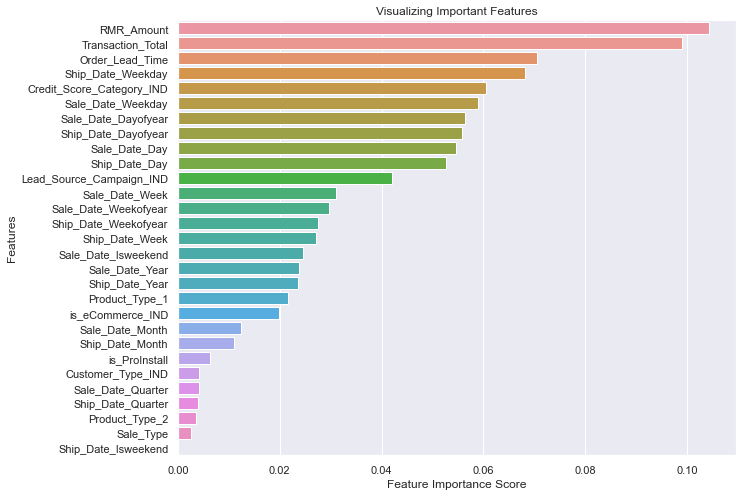

In [63]:
feature_imp = pd.Series(rf.feature_importances_,index=X.columns).sort_values(ascending=False)
%matplotlib inline
# Creating a bar plot
fig, ax = plt.subplots(figsize=(10,8))
sns.barplot(x=feature_imp, y=feature_imp.index)

plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features")
plt.show()

it seems that the top 4 most important features are:

- **RMR_Amount**: Recurring monthly Revenue amount  which is calculated from RMR_Rate and Transaction Total
- **Transaction_Total**: Transaction total for the Given order
- **Order_Lead_Time**: Difference in number of days between the ship_date and Sale_date 
- **Ship_Date_Weekday**: On which we are shipping the order, once the order has been placed.

There are also some disadvantages of using Random Forest as a Feature Importance. It has a tendency to inflate the importance of continuous features or high-cardinality categorical variables. Gven a chance i would explore other advacned techniques like shap values. etc.

#### My Personal Comments, observations and Experience (Null Findings) on Dataset.

1. If we add 'Days_Difference' (the difference between the Activation_date and Shipping_Date) as one of our predictor variables then it greatly increases the performance of our model(F-1 Score would be ~0.85). But that would be fundamentally wrong because as I said earlier `Ship_date` is a mid-event that happens between`Sale_Date` and `Activation_Date`. so If we use Days_Difference as one of the variables then I think we are leaking the information from independent variables to Dependent variables. I used that variable by mistake earlier but after that I removed it from my predictors.
2. I can see there is one variable Product_Class in the data dictionary but it is not available in the data. I am not sure how important that variable was it may have helped to feature engineer that variable with Product_Type.

In [ ]:
(df['Transaction_Total'] == 0.0).sum()

3. we have 11443 transactions where Transaction_total is zero. Is customer really buying something here or just add-ons? If its just add-ons do we really need to consider these data points in analysis?

4. Is there any way that we can capture the deliver_Date in the data because that will give us exact idea that customers who could not activate system within 30 days got enough time/days to activate the system?  

5. Do we really need to consider those data points where difference between `Ship_Date` and `Sale_Date` is more than 30 days? Because here customers do not get system to activate within 30 days of their `Sale_Date`.